In [1]:
import os
import librosa
import numpy as np
import tensorflow as tf
from tensorflow.image import resize

### Loaded model..

In [2]:
model = tf.keras.models.load_model("Hybrid_CRNN_Model.keras")
model.summary()

Model: "Hybrid_Custom_CRNN"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ spectrogram_input   │ (None, 150, 150,  │          0 │ -                 │
│ (InputLayer)        │ 1)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv_b1_1 (Conv2D)  │ (None, 150, 150,  │        320 │ spectrogram_inpu… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv_b1_2 (Conv2D)  │ (None, 148, 148,  │      9,248 │ conv_b1_1[0][0]   │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool_b1             │ (None, 74, 74,    │          0 │ conv_b1_2[0][0]   │
│ (MaxPooling2D)      │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 74, 74,    │        128 │ pool_b1[0][0]     │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv_b2_1 (Conv2D)  │ (None, 74, 74,    │     18,496 │ batch_normalizat… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv_b2_2 (Conv2D)  │ (None, 72, 72,    │     36,928 │ conv_b2_1[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool_b2             │ (None, 36, 36,    │          0 │ conv_b2_2[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 36, 36,    │        256 │ pool_b2[0][0]     │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv_b3_1 (Conv2D)  │ (None, 36, 36,    │     73,856 │ batch_normalizat… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv_b3_2 (Conv2D)  │ (None, 34, 34,    │    147,584 │ conv_b3_1[0][0]   │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool_b3             │ (None, 17, 17,    │          0 │ conv_b3_2[0][0]   │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 17, 17,    │        512 │ pool_b3[0][0]     │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv_b4_1 (Conv2D)  │ (None, 17, 17,    │    295,168 │ batch_normalizat… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv_b4_2 (Conv2D)  │ (None, 15, 15,    │    590,080 │ conv_b4_1[0][0]   │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool_b4             │ (None, 7, 7, 256) │          0 │ conv_b4_2[0][0]   │
│ (MaxPooling2D)      │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 7, 7, 256) │      1,024 │ pool_b4[0][0]   

 Total params: 5,500,864 (20.98 MB)

 Trainable params: 1,833,130 (6.99 MB)

 Non-trainable params: 1,472 (5.75 KB)

 Optimizer params: 3,666,262 (13.99 MB)

In [3]:
classes = ['blues', 'classical', 'country', 'disco', 'hiphop', 'jazz', 'metal', 'pop', 'reggae', 'rock']


### Single Audio Preprocessing

In [4]:
# Load and preprocess audio data
def load_and_preprocess_file(file_path, target_shape=(150, 150)):
    data = []
    audio_data, sample_rate = librosa.load(file_path, sr=None)
    # Perform preprocessing (e.g., convert to Mel spectrogram and resize)
    # Define the duration of each chunk and overlap
    chunk_duration = 4  # seconds
    overlap_duration = 2  # seconds

    # Convert durations to samples
    chunk_samples = chunk_duration * sample_rate
    overlap_samples = overlap_duration * sample_rate

    # Calculate the number of chunks
    num_chunks = int(np.ceil((len(audio_data) - chunk_samples) / (chunk_samples - overlap_samples))) + 1

    # Iterate over each chunk
    for i in range(num_chunks):
                    # Calculate start and end indices of the chunk
        start = i * (chunk_samples - overlap_samples)
        end = start + chunk_samples

                    # Extract the chunk of audio
        chunk = audio_data[start:end]

                    # Compute the Mel spectrogram for the chunk
        mel_spectrogram = librosa.feature.melspectrogram(y=chunk, sr=sample_rate)

                #mel_spectrogram = librosa.feature.melspectrogram(y=audio_data, sr=sample_rate)
        mel_spectrogram = resize(np.expand_dims(mel_spectrogram, axis=-1), target_shape)
        data.append(mel_spectrogram)

    return np.array(data)

## Playing a sound

In [5]:
from IPython.display import Audio
file_path = "Test_music/music_hiphop.mp3"
y, sr = librosa.load(file_path, sr=44100)
Audio(data=y, rate=sr)

In [6]:
X_test = load_and_preprocess_file(file_path)

In [7]:
X_test.shape

(48, 150, 150, 1)

### Model prediction

In [8]:
import matplotlib.pyplot as plt
import numpy as np

def predict_genre_with_confidence(file_path):
    print("\nAnalyzing:", file_path)
    
    # preprocess audio
    X_test = load_and_preprocess_file(file_path)
    
    if len(X_test) == 0:
        print("Error: Audio processing failed")
        return

    # get predictions
    probabilities = model.predict(X_test, verbose=0)

    # average across chunks
    mean_probabilities = np.mean(probabilities, axis=0)

    # find best match
    predicted_idx = np.argmax(mean_probabilities)
    predicted_genre = classes[predicted_idx]
    confidence = mean_probabilities[predicted_idx] * 100

    print("Prediction:", predicted_genre.upper())
    print("Confidence:", round(confidence, 2), "%")

    # create colors (simple loop)
    colors = []
    for i in range(len(classes)):
        if i == predicted_idx:
            colors.append('red')
        else:
            colors.append('grey')

    # plot
    plt.figure()
    bars = plt.bar(classes, mean_probabilities * 100, color=colors)

    plt.title("Genre Prediction")
    plt.xlabel("Genres")
    plt.ylabel("Confidence (%)")
    plt.xticks(rotation=45)
    plt.ylim(0, 100)

    # add labels on bars
    for bar in bars:
        height = bar.get_height()
        if height > 5:
            plt.text(bar.get_x() + bar.get_width()/2, height + 1, f"{height:.1f}%", ha='center')

    plt.tight_layout()
    plt.show()

    return predicted_genre

## Run Tests on Individual Tracks


Analyzing: Test_music/music_classical.mp3
Prediction: CLASSICAL
Confidence: 66.67 %


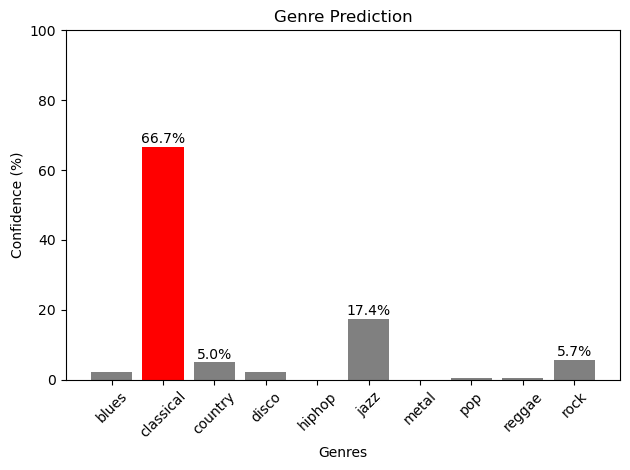


Analyzing: Test_music/music_disco.mp3
Prediction: DISCO
Confidence: 50.64 %


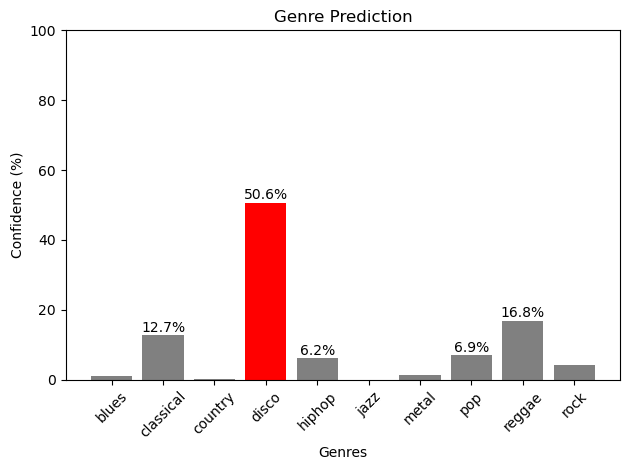


Analyzing: Test_music/music_hiphop.mp3
Prediction: HIPHOP
Confidence: 68.35 %


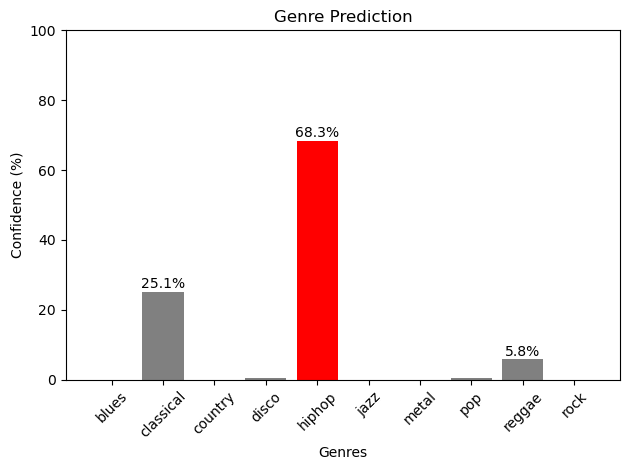


Analyzing: Test_music/music_jazz2.mp3
Prediction: JAZZ
Confidence: 69.06 %


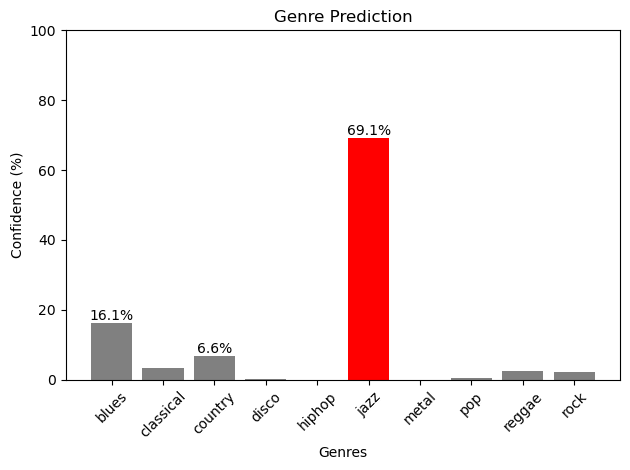


Analyzing: Test_music/music_rock.mp3
Prediction: POP
Confidence: 40.16 %


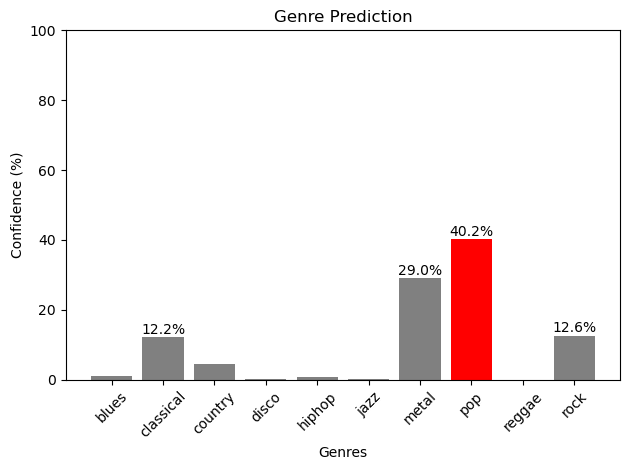

In [9]:
# Define your test tracks
test_files = [
    "Test_music/music_classical.mp3",
    "Test_music/music_disco.mp3",
    "Test_music/music_hiphop.mp3",
    "Test_music/music_jazz2.mp3",
    "Test_music/music_rock.mp3"
]

for track in test_files:
    try:
        predict_genre_with_confidence(track)
    except Exception as e:
        print(f"Could not process {track}: {e}")